### Import Required Libraries and Set Up Environment Variables

In [13]:
# Dependencies
import requests
import time
from dotenv import load_dotenv
import os
import pandas as pd
import json
import os
from datetime import datetime
## Load the NASA_API_KEY from the env file
load_dotenv()
NASA_API_KEY = os.getenv('NASA_API_KEY')

### CME Data

In [14]:
# Set the base URL to NASA's DONKI API:
base_url = "https://api.nasa.gov/DONKI/"

# Set the specifier for CMEs:
CME = "CME"

# Search for CMEs published between a begin and end date
startDate = "2022-05-01"
endDate   = "2024-05-01"

# Build URL for CME
new_url = base_url + CME + "?startDate=" + startDate + "&endDate=" + endDate + "&api_key=" + NASA_API_KEY
print(new_url)
#"https://api.nasa.gov/DONKI/CME?startDate=yyyy-MM-dd&endDate=yyyy-MM-dd&api_key=DEMO_KEY"

https://api.nasa.gov/DONKI/CME?startDate=2022-05-01&endDate=2024-05-01&api_key=hf9gzDPyAsdxa9zOU69AxS61xoTW0IRG8dFVCewi


In [15]:
# Make a "GET" request for the CME URL and store it in a variable named cme_response
cme_response = requests.get(new_url)


In [16]:
# Convert the response variable to json and store it as a variable named cme_json
cme_json = cme_response.json() 


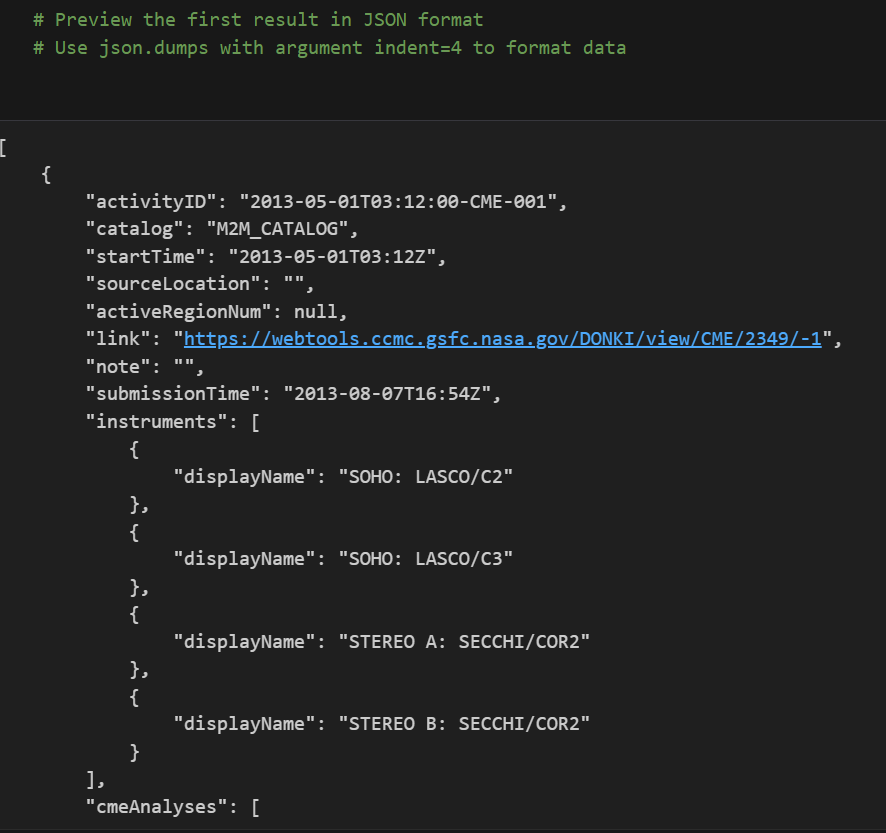

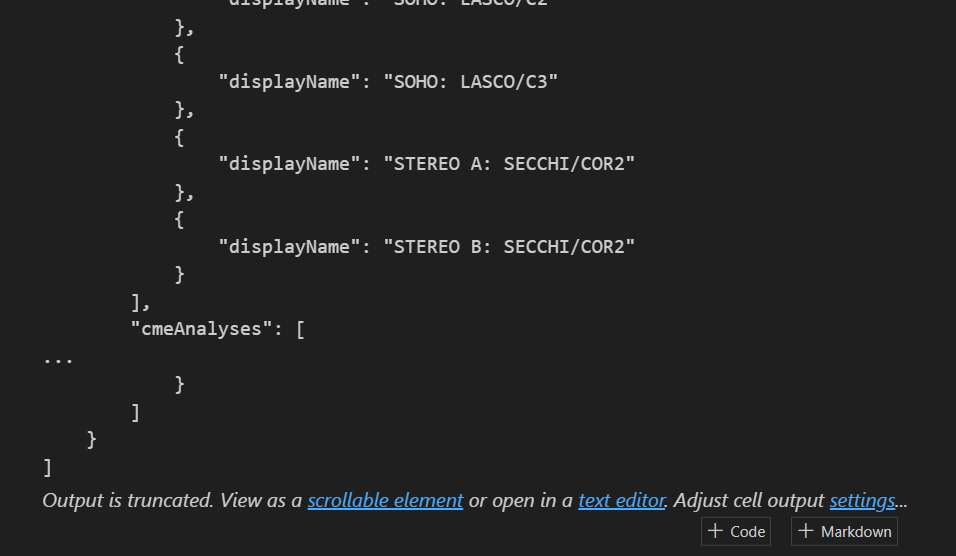

In [17]:
# Preview the first result in JSON format
# Use json.dumps with argument indent=4 to format data
print(json.dumps(cme_json, indent=4))


[
    {
        "activityID": "2022-05-01T05:00:00-CME-001",
        "catalog": "M2M_CATALOG",
        "startTime": "2022-05-01T05:00Z",
        "instruments": [
            {
                "displayName": "SOHO: LASCO/C2"
            },
            {
                "displayName": "SOHO: LASCO/C3"
            },
            {
                "displayName": "STEREO A: SECCHI/COR2"
            }
        ],
        "sourceLocation": "",
        "activeRegionNum": null,
        "note": "Associated with moving field lines above the western limb as seen in SDO AIA 171 around 2022-05-01T04:45Z and a slowly developing, faint CME to the west.",
        "submissionTime": "2022-05-01T16:01Z",
        "versionId": 2,
        "link": "https://webtools.ccmc.gsfc.nasa.gov/DONKI/view/CME/20025/-1",
        "cmeAnalyses": [
            {
                "isMostAccurate": true,
                "time21_5": "2022-05-01T11:01Z",
                "latitude": 6.0,
                "longitude": 109.0,
       

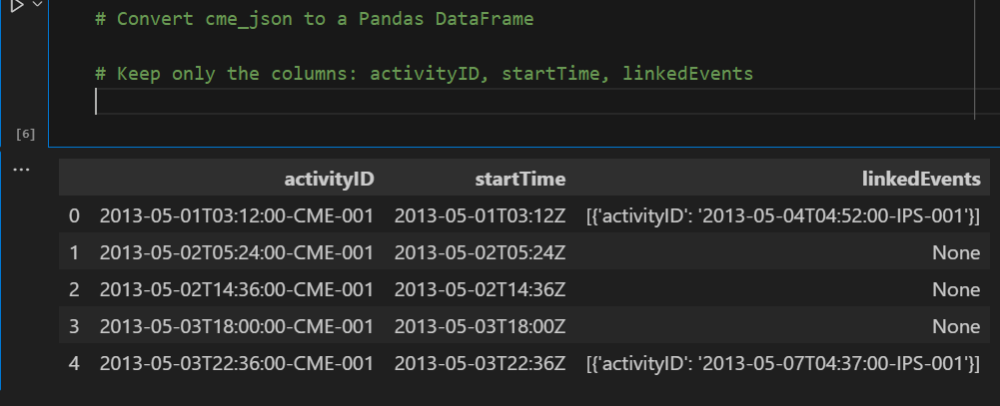

In [18]:
# Convert cme_json to a Pandas DataFrame 
cme_df = pd.DataFrame(cme_json)
cme_df = cme_df[['activityID', 'startTime', 'linkedEvents']]

# Keep only the columns: activityID, startTime, linkedEvents
cme_df

,activityID,startTime,linkedEvents
0,2022-05-01T05:00:00-CME-001,2022-05-01T05:00Z,None
1,2022-05-01T07:36:00-CME-001,2022-05-01T07:36Z,None
2,2022-05-01T08:36:00-CME-001,2022-05-01T08:36Z,None
3,2022-05-01T13:36:00-CME-001,2022-05-01T13:36Z,None
4,2022-05-01T21:36:00-CME-001,2022-05-01T21:36Z,None
...,...,...,...
2413,2024-05-01T06:36:00-CME-001,2024-05-01T06:36Z,None
2414,2024-05-01T11:36:00-CME-001,2024-05-01T11:36Z,None
2415,2024-05-01T12:36:00-CME-001,2024-05-01T12:36Z,None
2416,2024-05-01T17:36:00-CME-001,2024-05-01T17:36Z,None


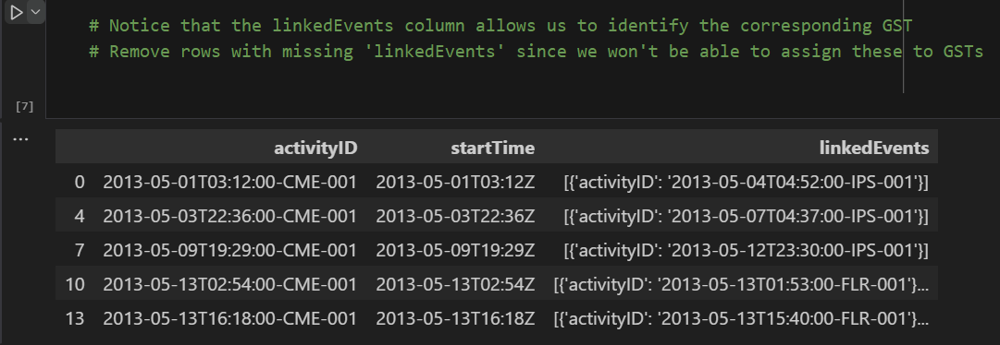

In [19]:
# Notice that the linkedEvents column allows us to identify the corresponding GST
# Remove rows with missing 'linkedEvents' since we won't be able to assign these to GSTs
cme_df.dropna(subset=['linkedEvents'], inplace=True)
cme_df


,activityID,startTime,linkedEvents
9,2022-05-03T08:36:00-CME-001,2022-05-03T08:36Z,[{'activityID': '2022-05-03T07:34:00-FLR-001'}]
11,2022-05-03T18:12:00-CME-001,2022-05-03T18:12Z,[{'activityID': '2022-05-08T04:34:00-IPS-001'}...
19,2022-05-06T21:24:00-CME-001,2022-05-06T21:24Z,[{'activityID': '2022-05-11T05:00:00-IPS-001'}...
22,2022-05-08T04:48:00-CME-001,2022-05-08T04:48Z,[{'activityID': '2022-05-08T03:38:00-FLR-001'}]
24,2022-05-08T22:24:00-CME-001,2022-05-08T22:24Z,[{'activityID': '2022-05-08T19:23:00-FLR-001'}...
...,...,...,...
2390,2024-04-24T01:48:00-CME-001,2024-04-24T01:48Z,[{'activityID': '2024-04-26T00:17:00-IPS-001'}]
2393,2024-04-24T15:05:00-CME-001,2024-04-24T15:05Z,[{'activityID': '2024-04-24T14:02:00-FLR-001'}]
2398,2024-04-25T18:24:00-CME-001,2024-04-25T18:24Z,[{'activityID': '2024-04-25T17:03:00-FLR-001'}]
2410,2024-04-30T00:36:00-CME-001,2024-04-30T00:36Z,[{'activityID': '2024-04-30T00:46:00-FLR-001'}]


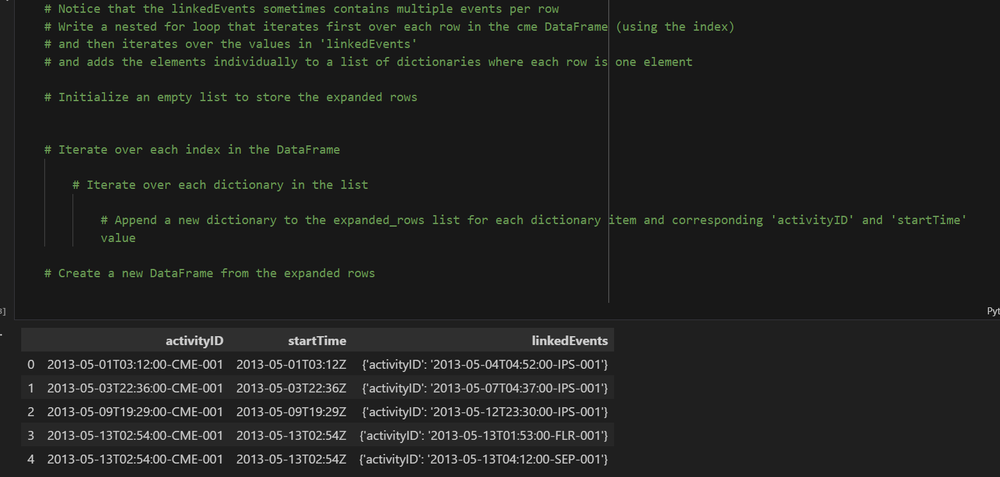

In [12]:
# Notice that the linkedEvents sometimes contains multiple events per row
# Write a nested for loop that iterates first over each row in the cme DataFrame (using the index)
# and then iterates over the values in 'linkedEvents' 
# and adds the elements individually to a list of dictionaries where each row is one element 

# Initialize an empty list to store the expanded rows
expanded_rows = []


# Iterate over each index in the DataFrame
for index, row in cme_df.iterrows():

    # Iterate over each dictionary in the list
   for linked_event in row['linkedEvents']:
        # Append a new dictionary to the expanded_rows list for each dictionary item and corresponding 'activityID' and 'startTime' value
      new_row = {
            'activityID': row['activityID'],
            'startTime': row['startTime'],
            'linkedEvents': linked_event['activityID']
            }
      # Use the update method to merge the dictionaries, this avoids the TypeError
      new_row.update(linked_event)
      expanded_rows.append(new_row)

# Create a new DataFrame from the expanded rows
expanded_cme_df = pd.DataFrame(expanded_rows)
expanded_cme_df



,activityID,startTime,linkedEvents
0,2022-05-03T07:34:00-FLR-001,2022-05-03T08:36Z,2022-05-03T07:34:00-FLR-001
1,2022-05-08T04:34:00-IPS-001,2022-05-03T18:12Z,2022-05-08T04:34:00-IPS-001
2,2022-05-08T06:24:00-IPS-001,2022-05-03T18:12Z,2022-05-08T06:24:00-IPS-001
3,2022-05-11T05:00:00-IPS-001,2022-05-06T21:24Z,2022-05-11T05:00:00-IPS-001
4,2022-05-11T12:03:00-IPS-001,2022-05-06T21:24Z,2022-05-11T12:03:00-IPS-001
...,...,...,...
818,2024-04-26T00:17:00-IPS-001,2024-04-24T01:48Z,2024-04-26T00:17:00-IPS-001
819,2024-04-24T14:02:00-FLR-001,2024-04-24T15:05Z,2024-04-24T14:02:00-FLR-001
820,2024-04-25T17:03:00-FLR-001,2024-04-25T18:24Z,2024-04-25T17:03:00-FLR-001
821,2024-04-30T00:46:00-FLR-001,2024-04-30T00:36Z,2024-04-30T00:46:00-FLR-001


MARKDOWN
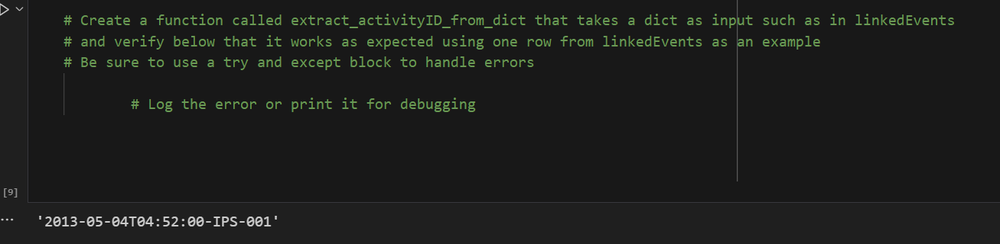

In [21]:
# Create a function called extract_activityID_from_dict that takes a dict as input such as in linkedEvents
# and verify below that it works as expected using one row from linkedEvents as an example
# Be sure to use a try and except block to handle errors
def extract_activityID_from_dict(input_dict):
    """
    Extracts the 'activityID' value from a dictionary.

    Args:
        input_dict (dict): The input dictionary.

    Returns:
        str: The 'activityID' value if found, otherwise None.
    """
    try:
        return input_dict['activityID']
    except KeyError:
        print(f"Error: 'activityID' key not found in dictionary: {input_dict}")
        return None

        # Log the error or print it for debugging
# Verify the function with an example
example_dict = {'activityID': 'GST12345', 'other_key': 'some_value'}
extracted_id = extract_activityID_from_dict(example_dict)
print(f"Extracted activityID: {extracted_id}")

# Example with missing key to trigger the exception
example_dict_missing_key = {'other_key': 'some_value'}
extracted_id_missing = extract_activityID_from_dict(example_dict_missing_key)
print(f"Extracted activityID (missing key): {extracted_id_missing}")
        




Extracted activityID: GST12345
Error: 'activityID' key not found in dictionary: {'other_key': 'some_value'}
Extracted activityID (missing key): None


MARKDOWN 
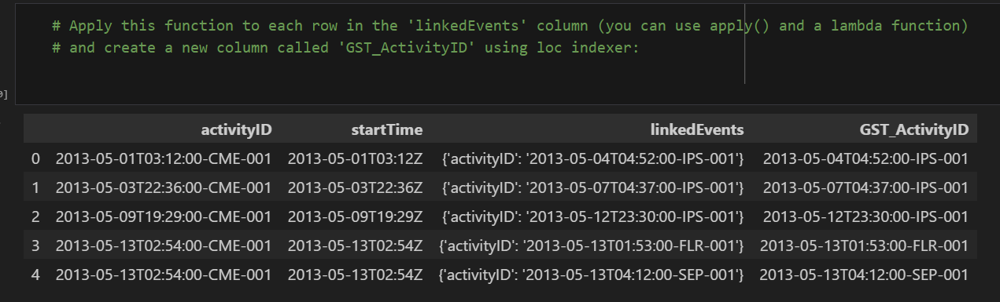

In [26]:
# Apply this function to each row in the 'linkedEvents' column (you can use apply() and a lambda function)
# and create a new column called 'GST_ActivityID' using loc indexer:
expanded_cme_df['GST_ActivityID'] = expanded_cme_df.apply(lambda x: extract_activityID_from_dict(x), axis=1)
expanded_cme_df


,activityID,startTime,linkedEvents,GST_ActivityID
0,2022-05-03T07:34:00-FLR-001,2022-05-03T08:36Z,2022-05-03T07:34:00-FLR-001,2022-05-03T07:34:00-FLR-001
1,2022-05-08T04:34:00-IPS-001,2022-05-03T18:12Z,2022-05-08T04:34:00-IPS-001,2022-05-08T04:34:00-IPS-001
2,2022-05-08T06:24:00-IPS-001,2022-05-03T18:12Z,2022-05-08T06:24:00-IPS-001,2022-05-08T06:24:00-IPS-001
3,2022-05-11T05:00:00-IPS-001,2022-05-06T21:24Z,2022-05-11T05:00:00-IPS-001,2022-05-11T05:00:00-IPS-001
4,2022-05-11T12:03:00-IPS-001,2022-05-06T21:24Z,2022-05-11T12:03:00-IPS-001,2022-05-11T12:03:00-IPS-001
...,...,...,...,...
818,2024-04-26T00:17:00-IPS-001,2024-04-24T01:48Z,2024-04-26T00:17:00-IPS-001,2024-04-26T00:17:00-IPS-001
819,2024-04-24T14:02:00-FLR-001,2024-04-24T15:05Z,2024-04-24T14:02:00-FLR-001,2024-04-24T14:02:00-FLR-001
820,2024-04-25T17:03:00-FLR-001,2024-04-25T18:24Z,2024-04-25T17:03:00-FLR-001,2024-04-25T17:03:00-FLR-001
821,2024-04-30T00:46:00-FLR-001,2024-04-30T00:36Z,2024-04-30T00:46:00-FLR-001,2024-04-30T00:46:00-FLR-001


In [27]:
# Remove rows with missing GST_ActivityID, since we can't assign them to GSTs:
expanded_cme_df.dropna(subset=['GST_ActivityID'], inplace=True)
expanded_cme_df


,activityID,startTime,linkedEvents,GST_ActivityID
0,2022-05-03T07:34:00-FLR-001,2022-05-03T08:36Z,2022-05-03T07:34:00-FLR-001,2022-05-03T07:34:00-FLR-001
1,2022-05-08T04:34:00-IPS-001,2022-05-03T18:12Z,2022-05-08T04:34:00-IPS-001,2022-05-08T04:34:00-IPS-001
2,2022-05-08T06:24:00-IPS-001,2022-05-03T18:12Z,2022-05-08T06:24:00-IPS-001,2022-05-08T06:24:00-IPS-001
3,2022-05-11T05:00:00-IPS-001,2022-05-06T21:24Z,2022-05-11T05:00:00-IPS-001,2022-05-11T05:00:00-IPS-001
4,2022-05-11T12:03:00-IPS-001,2022-05-06T21:24Z,2022-05-11T12:03:00-IPS-001,2022-05-11T12:03:00-IPS-001
...,...,...,...,...
818,2024-04-26T00:17:00-IPS-001,2024-04-24T01:48Z,2024-04-26T00:17:00-IPS-001,2024-04-26T00:17:00-IPS-001
819,2024-04-24T14:02:00-FLR-001,2024-04-24T15:05Z,2024-04-24T14:02:00-FLR-001,2024-04-24T14:02:00-FLR-001
820,2024-04-25T17:03:00-FLR-001,2024-04-25T18:24Z,2024-04-25T17:03:00-FLR-001,2024-04-25T17:03:00-FLR-001
821,2024-04-30T00:46:00-FLR-001,2024-04-30T00:36Z,2024-04-30T00:46:00-FLR-001,2024-04-30T00:46:00-FLR-001


MARKDOWN 
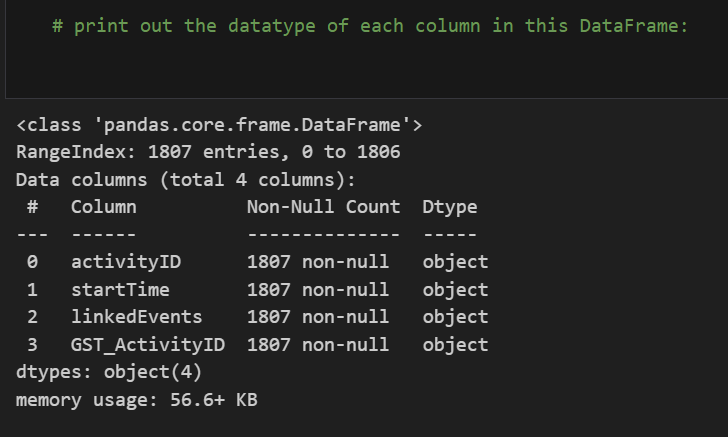


In [28]:
# print out the datatype of each column in this DataFrame:
expanded_cme_df.dtypes



activityID        object
startTime         object
linkedEvents      object
GST_ActivityID    object
dtype: object

MARKDOWN 
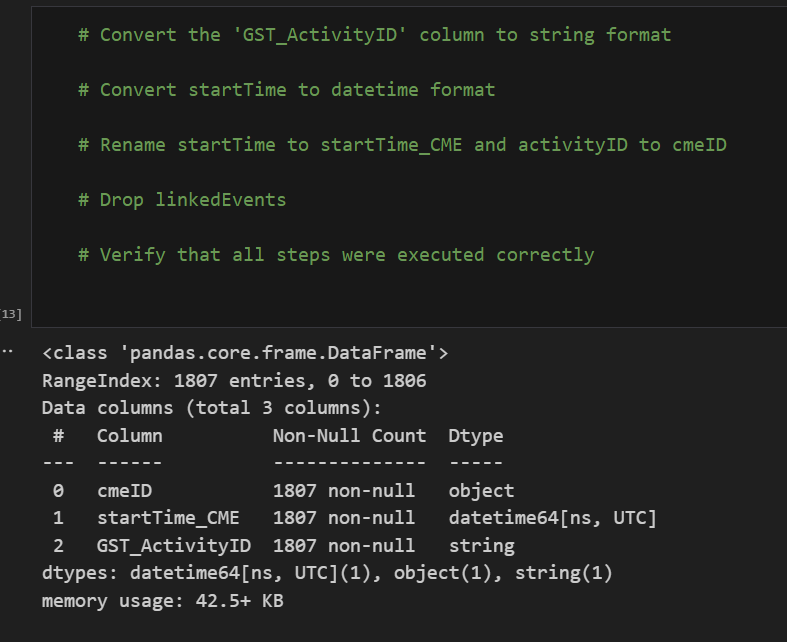

In [29]:
# Convert the 'GST_ActivityID' column to string format 
expanded_cme_df['GST_ActivityID'] = expanded_cme_df['GST_ActivityID'].astype(str)

# Convert startTime to datetime format
expanded_cme_df['startTime'] = pd.to_datetime(expanded_cme_df['startTime'])

# Rename startTime to startTime_CME and activityID to cmeID
expanded_cme_df['GST_ActivityID'] = expanded_cme_df['GST_ActivityID'].astype(str)
expanded_cme_df = expanded_cme_df.rename(columns={'startTime': 'startTime_CME', 'activityID': 'cmeID'})

# Drop linkedEvents
expanded_cme_df = expanded_cme_df.drop(columns=['linkedEvents'])

# Verify that all steps were executed correctly
print(expanded_cme_df.dtypes)
print(expanded_cme_df.head())


cmeID                          object
startTime_CME     datetime64[ns, UTC]
GST_ActivityID                 object
dtype: object
                         cmeID             startTime_CME  \
0  2022-05-03T07:34:00-FLR-001 2022-05-03 08:36:00+00:00   
1  2022-05-08T04:34:00-IPS-001 2022-05-03 18:12:00+00:00   
2  2022-05-08T06:24:00-IPS-001 2022-05-03 18:12:00+00:00   
3  2022-05-11T05:00:00-IPS-001 2022-05-06 21:24:00+00:00   
4  2022-05-11T12:03:00-IPS-001 2022-05-06 21:24:00+00:00   

                GST_ActivityID  
0  2022-05-03T07:34:00-FLR-001  
1  2022-05-08T04:34:00-IPS-001  
2  2022-05-08T06:24:00-IPS-001  
3  2022-05-11T05:00:00-IPS-001  
4  2022-05-11T12:03:00-IPS-001  


MARKDOWN
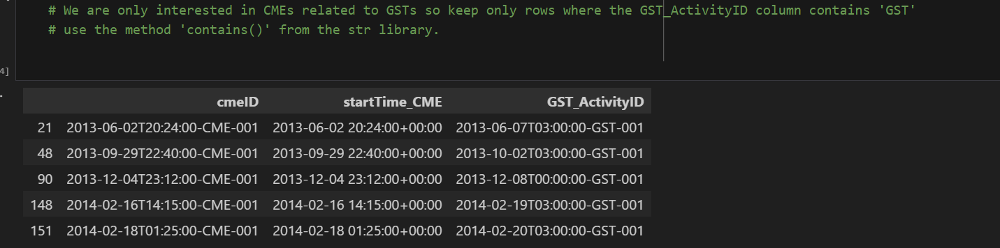

In [30]:
# We are only interested in CMEs related to GSTs so keep only rows where the GST_ActivityID column contains 'GST'
# use the method 'contains()' from the str library.  
expanded_cme_df = expanded_cme_df[expanded_cme_df['GST_ActivityID'].str.contains('GST')]
expanded_cme_df.head()

,cmeID,startTime_CME,GST_ActivityID
61,2022-08-17T18:00:00-GST-001,2022-08-13 18:48:00+00:00,2022-08-17T18:00:00-GST-001
65,2022-08-17T18:00:00-GST-001,2022-08-14 12:48:00+00:00,2022-08-17T18:00:00-GST-001
227,2023-02-27T03:00:00-GST-001,2023-02-24 20:36:00+00:00,2023-02-27T03:00:00-GST-001
271,2023-03-23T12:00:00-GST-001,2023-03-20 02:41:00+00:00,2023-03-23T12:00:00-GST-001
277,2023-03-23T12:00:00-GST-001,2023-03-20 14:42:00+00:00,2023-03-23T12:00:00-GST-001


### GST Data

MARKDOWN
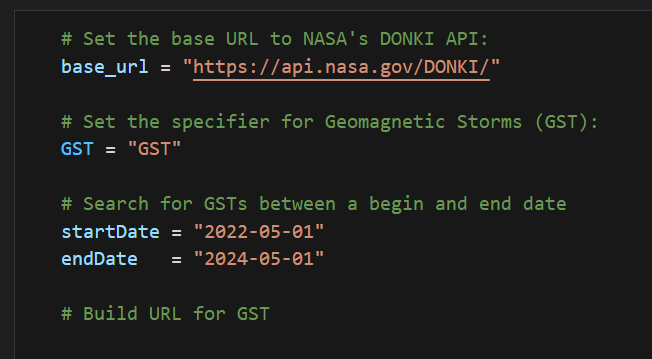

In [31]:
# Set the base URL to NASA's DONKI API:
base_url = "https://api.nasa.gov/DONKI/"

# Set the specifier for Geomagnetic Storms (GST):
GST = "GST"

# Search for GSTs between a begin and end date
startDate = "2022-05-01"
endDate   = "2024-05-01"

# Build URL for GST
gst_url = base_url + GST + "?startDate=" + startDate + "&endDate=" + endDate + "&api_key=" + NASA_API_KEY 
print(gst_url)


https://api.nasa.gov/DONKI/GST?startDate=2022-05-01&endDate=2024-05-01&api_key=hf9gzDPyAsdxa9zOU69AxS61xoTW0IRG8dFVCewi


MARKDOWN 
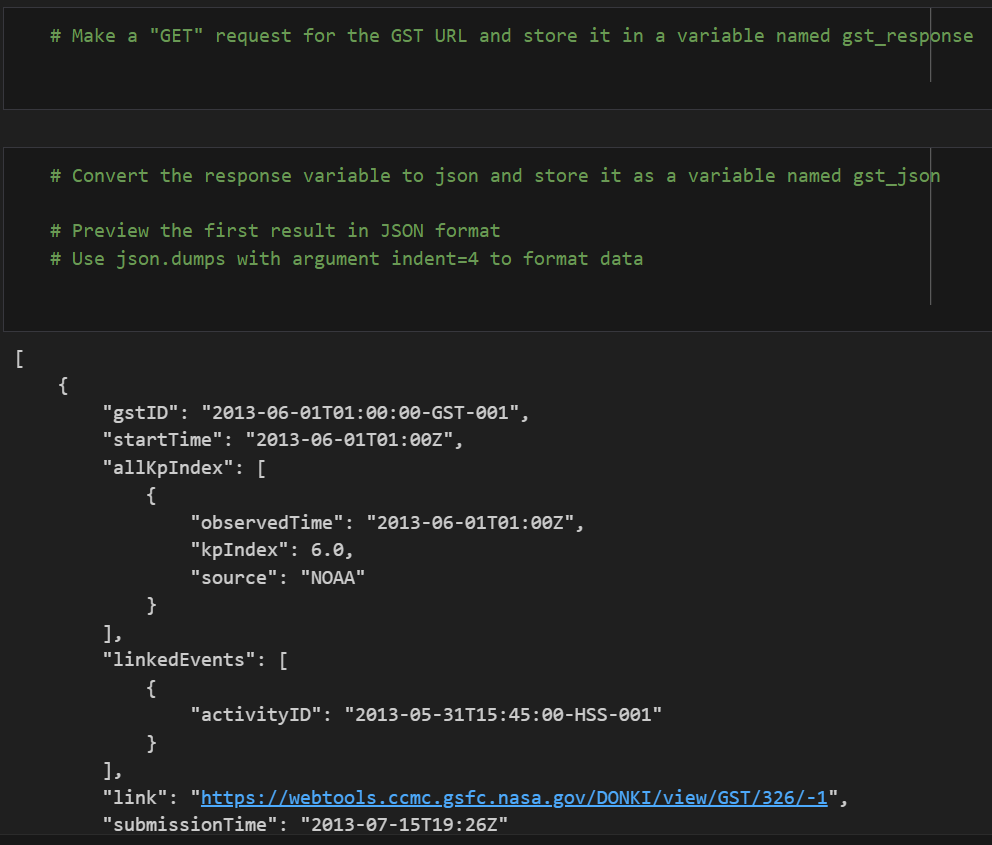
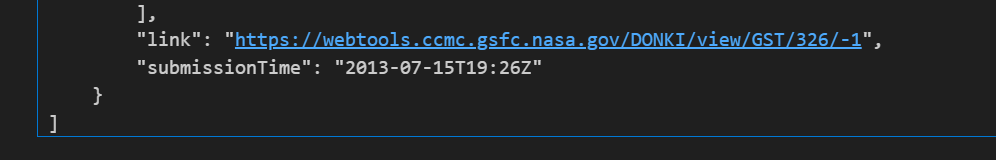

In [33]:
# Make a "GET" request for the GST URL and store it in a variable named gst_response
gst_response = requests.get(gst_url)


In [34]:
# Convert the response variable to json and store it as a variable named gst_json
gst_json = gst_response.json()

# Preview the first result in JSON format
# Use json.dumps with argument indent=4 to format data
print(json.dumps(gst_json[0], indent=4)) 


{
    "gstID": "2022-08-07T21:00:00-GST-001",
    "startTime": "2022-08-07T21:00Z",
    "allKpIndex": [
        {
            "observedTime": "2022-08-08T00:00Z",
            "kpIndex": 6.0,
            "source": "NOAA"
        }
    ],
    "link": "https://webtools.ccmc.gsfc.nasa.gov/DONKI/view/GST/21134/-1",
    "linkedEvents": [
        {
            "activityID": "2022-08-07T00:45:00-HSS-001"
        },
        {
            "activityID": "2022-08-07T00:45:00-IPS-001"
        }
    ],
    "submissionTime": "2022-08-08T00:33Z",
    "versionId": 1
}


MARKDOWN 
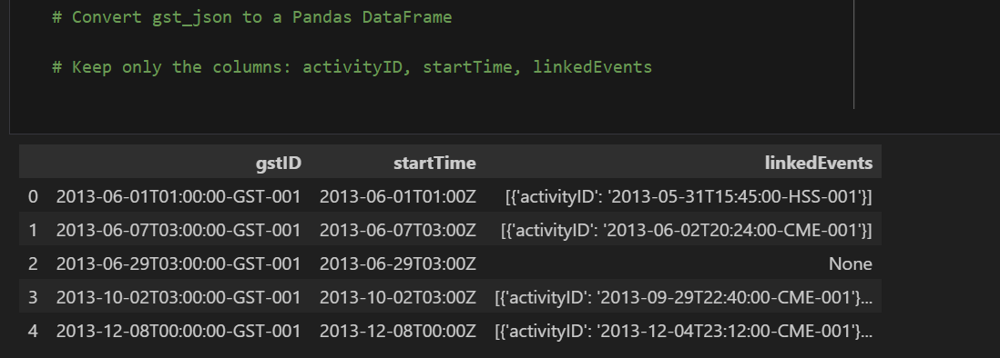

In [35]:
# Convert gst_json to a Pandas DataFrame  
gst_df = pd.DataFrame(gst_json)

# Keep only the columns: activityID, startTime, linkedEvents
gst_df = gst_df[['gstID', 'startTime', 'linkedEvents']]
gst_df = gst_df.rename(columns={'gstID': 'activityID'})
gst_df.head()


,activityID,startTime,linkedEvents
0,2022-08-07T21:00:00-GST-001,2022-08-07T21:00Z,[{'activityID': '2022-08-07T00:45:00-HSS-001'}...
1,2022-08-17T18:00:00-GST-001,2022-08-17T18:00Z,[{'activityID': '2022-08-13T18:48:00-CME-001'}...
2,2022-09-04T03:00:00-GST-001,2022-09-04T03:00Z,[{'activityID': '2022-09-03T08:20:00-HSS-001'}]
3,2022-09-27T00:00:00-GST-001,2022-09-27T00:00Z,[{'activityID': '2022-09-27T01:13:00-HSS-001'}]
4,2023-02-27T03:00:00-GST-001,2023-02-27T03:00Z,[{'activityID': '2023-02-24T20:36:00-CME-001'}...


MARKDOWN 
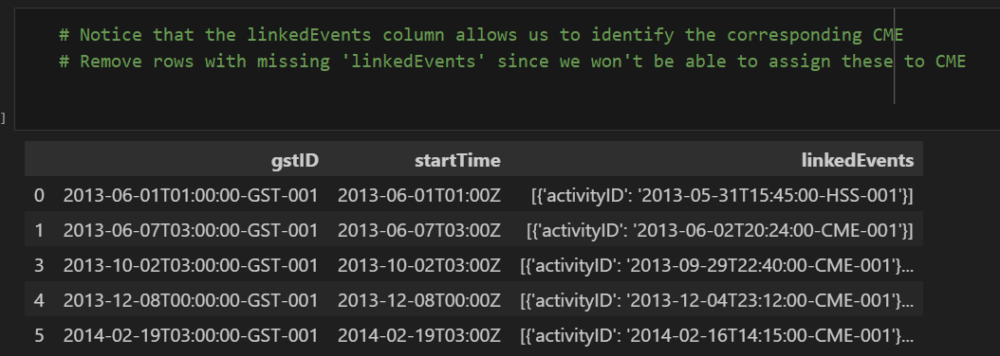

In [36]:
# Notice that the linkedEvents column allows us to identify the corresponding CME
# Remove rows with missing 'linkedEvents' since we won't be able to assign these to CME
gst_df.dropna(subset=['linkedEvents'], inplace=True)
gst_df.head()



,activityID,startTime,linkedEvents
0,2022-08-07T21:00:00-GST-001,2022-08-07T21:00Z,[{'activityID': '2022-08-07T00:45:00-HSS-001'}...
1,2022-08-17T18:00:00-GST-001,2022-08-17T18:00Z,[{'activityID': '2022-08-13T18:48:00-CME-001'}...
2,2022-09-04T03:00:00-GST-001,2022-09-04T03:00Z,[{'activityID': '2022-09-03T08:20:00-HSS-001'}]
3,2022-09-27T00:00:00-GST-001,2022-09-27T00:00Z,[{'activityID': '2022-09-27T01:13:00-HSS-001'}]
4,2023-02-27T03:00:00-GST-001,2023-02-27T03:00Z,[{'activityID': '2023-02-24T20:36:00-CME-001'}...


MARKDOWN 
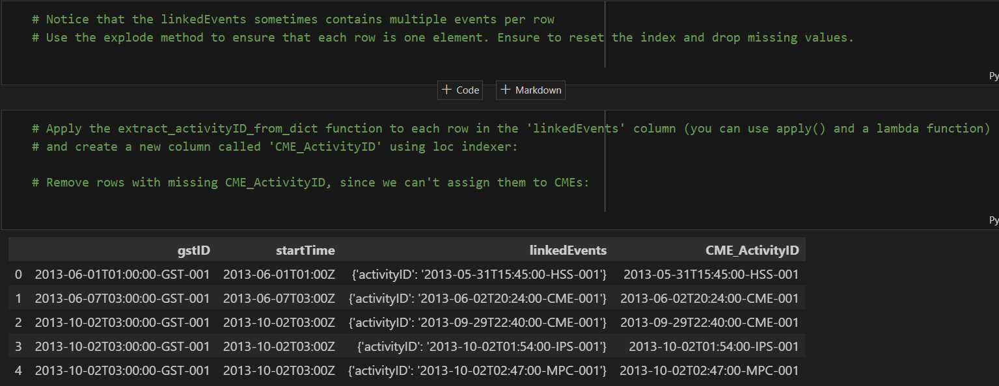

In [37]:
# Notice that the linkedEvents sometimes contains multiple events per row
# Use the explode method to ensure that each row is one element. Ensure to reset the index and drop missing values.

# Remove rows with missing 'linkedEvents'
gst_df.dropna(subset=['linkedEvents'], inplace=True) 

# Explode 'linkedEvents', reset index, and drop missing values
gst_df = gst_df.explode('linkedEvents', ignore_index=True)  # Explode 'linkedEvents'
gst_df.reset_index(drop=True, inplace=True) 

# Extract the 'activityID' from the 'linkedEvents' dictionaries
gst_df['CME_ActivityID'] = gst_df['linkedEvents'].apply(lambda x: x.get('activityID') if isinstance(x, dict) else None)

# Remove rows with missing CME_ActivityID
gst_df.dropna(subset=['CME_ActivityID'], inplace=True)

gst_df.head()


,activityID,startTime,linkedEvents,CME_ActivityID
0,2022-08-07T21:00:00-GST-001,2022-08-07T21:00Z,{'activityID': '2022-08-07T00:45:00-HSS-001'},2022-08-07T00:45:00-HSS-001
1,2022-08-07T21:00:00-GST-001,2022-08-07T21:00Z,{'activityID': '2022-08-07T00:45:00-IPS-001'},2022-08-07T00:45:00-IPS-001
2,2022-08-17T18:00:00-GST-001,2022-08-17T18:00Z,{'activityID': '2022-08-13T18:48:00-CME-001'},2022-08-13T18:48:00-CME-001
3,2022-08-17T18:00:00-GST-001,2022-08-17T18:00Z,{'activityID': '2022-08-14T12:48:00-CME-001'},2022-08-14T12:48:00-CME-001
4,2022-08-17T18:00:00-GST-001,2022-08-17T18:00Z,{'activityID': '2022-08-17T02:14:00-IPS-001'},2022-08-17T02:14:00-IPS-001


In [38]:
# Apply the extract_activityID_from_dict function to each row in the 'linkedEvents' column (you can use apply() and a lambda function)
# and create a new column called 'CME_ActivityID' using loc indexer:
gst_df['CME_ActivityID'] = gst_df['linkedEvents'].apply(lambda x: extract_activityID_from_dict(x) if isinstance(x, dict) else None) 

# Remove rows with missing CME_ActivityID, since we can't assign them to CMEs:
gst_df.dropna(subset=['CME_ActivityID'], inplace=True)

gst_df.head()

# Remove rows with missing CME_ActivityID, since we can't assign them to CMEs:


,activityID,startTime,linkedEvents,CME_ActivityID
0,2022-08-07T21:00:00-GST-001,2022-08-07T21:00Z,{'activityID': '2022-08-07T00:45:00-HSS-001'},2022-08-07T00:45:00-HSS-001
1,2022-08-07T21:00:00-GST-001,2022-08-07T21:00Z,{'activityID': '2022-08-07T00:45:00-IPS-001'},2022-08-07T00:45:00-IPS-001
2,2022-08-17T18:00:00-GST-001,2022-08-17T18:00Z,{'activityID': '2022-08-13T18:48:00-CME-001'},2022-08-13T18:48:00-CME-001
3,2022-08-17T18:00:00-GST-001,2022-08-17T18:00Z,{'activityID': '2022-08-14T12:48:00-CME-001'},2022-08-14T12:48:00-CME-001
4,2022-08-17T18:00:00-GST-001,2022-08-17T18:00Z,{'activityID': '2022-08-17T02:14:00-IPS-001'},2022-08-17T02:14:00-IPS-001


MARKDOWN
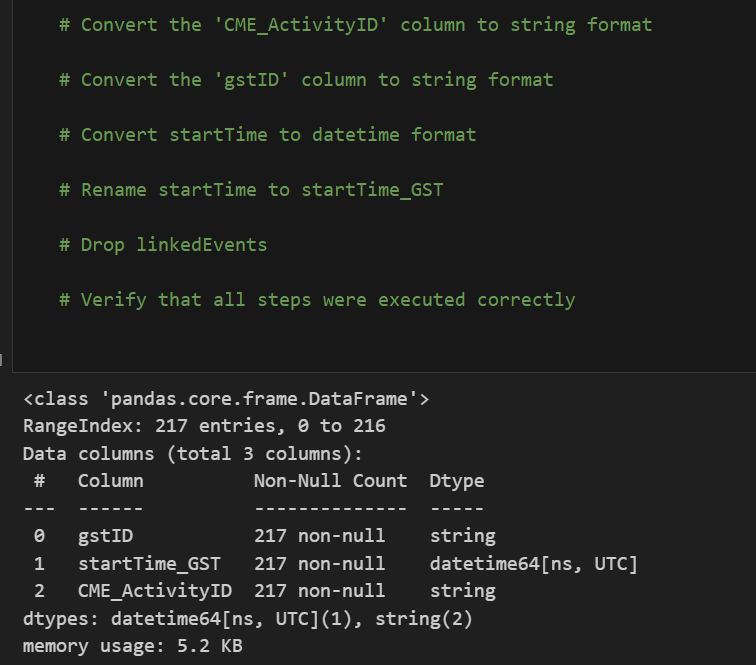

In [39]:
# Convert the 'CME_ActivityID' column to string format 
gst_df['CME_ActivityID'] = gst_df['CME_ActivityID'].astype(str)

# Convert the 'gstID' column to string format
gst_df['activityID'] = gst_df['activityID'].astype(str) 

# Convert startTime to datetime format
gst_df['startTime'] = pd.to_datetime(gst_df['startTime'])

# Rename startTime to startTime_GST
gst_df = gst_df.rename(columns={'startTime': 'startTime_GST'})

# Drop linkedEvents
gst_df = gst_df.drop(columns=['linkedEvents'])

# Verify that all steps were executed correctly
print(gst_df.dtypes)
print(gst_df.head())


activityID                     object
startTime_GST     datetime64[ns, UTC]
CME_ActivityID                 object
dtype: object
                    activityID             startTime_GST  \
0  2022-08-07T21:00:00-GST-001 2022-08-07 21:00:00+00:00   
1  2022-08-07T21:00:00-GST-001 2022-08-07 21:00:00+00:00   
2  2022-08-17T18:00:00-GST-001 2022-08-17 18:00:00+00:00   
3  2022-08-17T18:00:00-GST-001 2022-08-17 18:00:00+00:00   
4  2022-08-17T18:00:00-GST-001 2022-08-17 18:00:00+00:00   

                CME_ActivityID  
0  2022-08-07T00:45:00-HSS-001  
1  2022-08-07T00:45:00-IPS-001  
2  2022-08-13T18:48:00-CME-001  
3  2022-08-14T12:48:00-CME-001  
4  2022-08-17T02:14:00-IPS-001  


MARKDOWN 
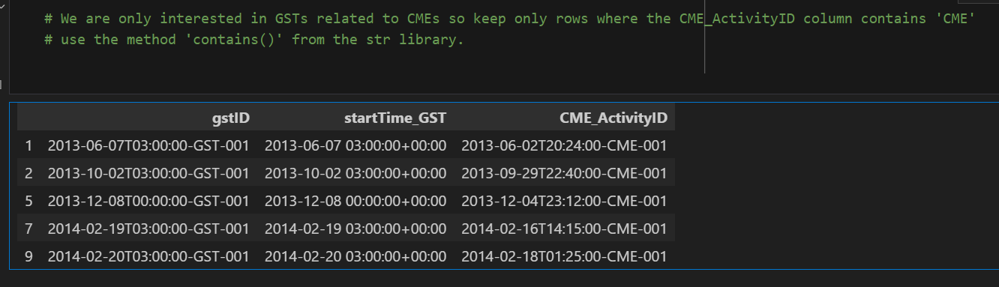

In [40]:
# We are only interested in GSTs related to CMEs so keep only rows where the CME_ActivityID column contains 'CME'
# use the method 'contains()' from the str library.  
gst_df = gst_df[gst_df['CME_ActivityID'].str.contains('CME')]  

gst_df.head()


,activityID,startTime_GST,CME_ActivityID
2,2022-08-17T18:00:00-GST-001,2022-08-17 18:00:00+00:00,2022-08-13T18:48:00-CME-001
3,2022-08-17T18:00:00-GST-001,2022-08-17 18:00:00+00:00,2022-08-14T12:48:00-CME-001
8,2023-02-27T03:00:00-GST-001,2023-02-27 03:00:00+00:00,2023-02-24T20:36:00-CME-001
13,2023-03-23T12:00:00-GST-001,2023-03-23 12:00:00+00:00,2023-03-20T02:41:00-CME-001
14,2023-03-23T12:00:00-GST-001,2023-03-23 12:00:00+00:00,2023-03-20T14:42:00-CME-001


### Merge both datatsets

MARKDOWN 
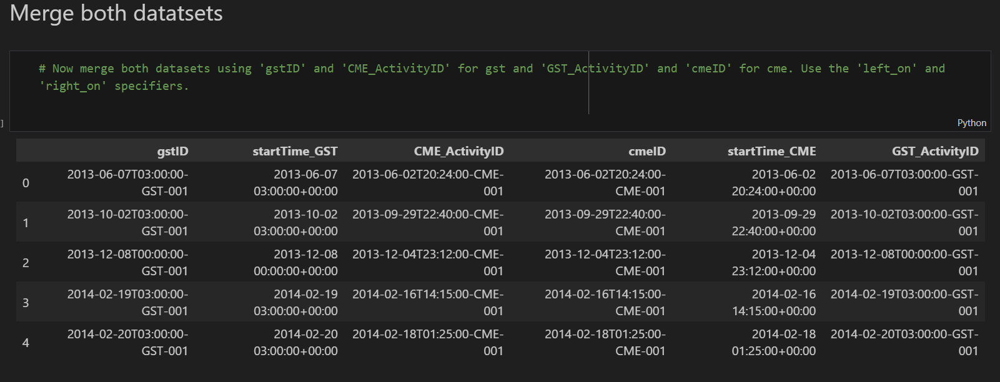

In [41]:
# Now merge both datasets using 'gstID' and 'CME_ActivityID' for gst and 'GST_ActivityID' and 'cmeID' for cme. Use the 'left_on' and 'right_on' specifiers.
merged_df = pd.merge(gst_df, expanded_cme_df, left_on=['activityID', 'CME_ActivityID'], right_on=['GST_ActivityID', 'cmeID'], how='left')

merged_df.head()


,activityID,startTime_GST,CME_ActivityID,cmeID,startTime_CME,GST_ActivityID
0,2022-08-17T18:00:00-GST-001,2022-08-17 18:00:00+00:00,2022-08-13T18:48:00-CME-001,NaN,NaT,NaN
1,2022-08-17T18:00:00-GST-001,2022-08-17 18:00:00+00:00,2022-08-14T12:48:00-CME-001,NaN,NaT,NaN
2,2023-02-27T03:00:00-GST-001,2023-02-27 03:00:00+00:00,2023-02-24T20:36:00-CME-001,NaN,NaT,NaN
3,2023-03-23T12:00:00-GST-001,2023-03-23 12:00:00+00:00,2023-03-20T02:41:00-CME-001,NaN,NaT,NaN
4,2023-03-23T12:00:00-GST-001,2023-03-23 12:00:00+00:00,2023-03-20T14:42:00-CME-001,NaN,NaT,NaN


MARKDOWN 
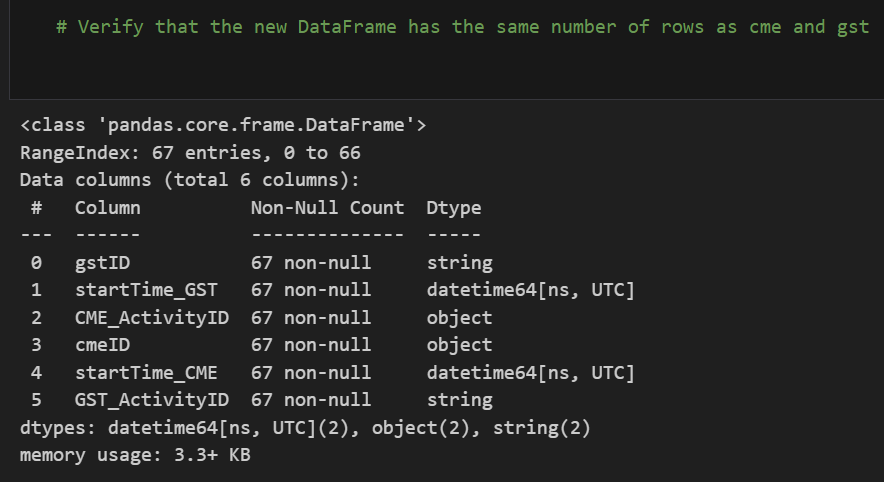

In [42]:
# Verify that the new DataFrame has the same number of rows as cme and gst
print(merged_df.dtypes)
print(merged_df.head())

# Verify the number of rows
print("Number of rows in merged_df:", len(merged_df))
print("Number of rows in expanded_cme_df:", len(expanded_cme_df))
print("Number of rows in gst_df:", len(gst_df))

# Check if the number of rows in merged_df is equal to the number of rows in gst_df
if len(merged_df) == len(gst_df):
    print("Merged DataFrame has the same number of rows as gst_df.")
else:
    print("Merged DataFrame does NOT have the same number of rows as gst_df.")


activityID                     object
startTime_GST     datetime64[ns, UTC]
CME_ActivityID                 object
cmeID                          object
startTime_CME     datetime64[ns, UTC]
GST_ActivityID                 object
dtype: object
                    activityID             startTime_GST  \
0  2022-08-17T18:00:00-GST-001 2022-08-17 18:00:00+00:00   
1  2022-08-17T18:00:00-GST-001 2022-08-17 18:00:00+00:00   
2  2023-02-27T03:00:00-GST-001 2023-02-27 03:00:00+00:00   
3  2023-03-23T12:00:00-GST-001 2023-03-23 12:00:00+00:00   
4  2023-03-23T12:00:00-GST-001 2023-03-23 12:00:00+00:00   

                CME_ActivityID cmeID startTime_CME GST_ActivityID  
0  2022-08-13T18:48:00-CME-001   NaN           NaT            NaN  
1  2022-08-14T12:48:00-CME-001   NaN           NaT            NaN  
2  2023-02-24T20:36:00-CME-001   NaN           NaT            NaN  
3  2023-03-20T02:41:00-CME-001   NaN           NaT            NaN  
4  2023-03-20T14:42:00-CME-001   NaN           NaT       

### Computing the time it takes for a CME to cause a GST

MARKDOWN 
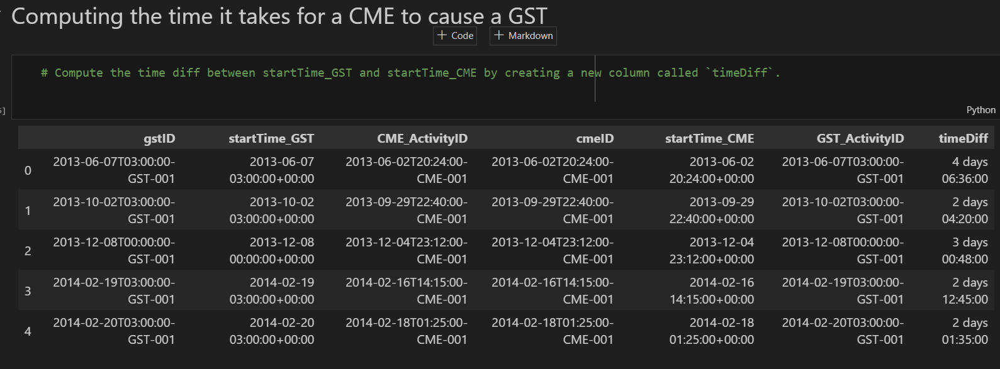

In [43]:
# Compute the time diff between startTime_GST and startTime_CME by creating a new column called `timeDiff`.
merged_df['timeDiff'] = merged_df['startTime_GST'] - merged_df['startTime_CME']

merged_df.head()

,activityID,startTime_GST,CME_ActivityID,cmeID,startTime_CME,GST_ActivityID,timeDiff
0,2022-08-17T18:00:00-GST-001,2022-08-17 18:00:00+00:00,2022-08-13T18:48:00-CME-001,NaN,NaT,NaN,NaT
1,2022-08-17T18:00:00-GST-001,2022-08-17 18:00:00+00:00,2022-08-14T12:48:00-CME-001,NaN,NaT,NaN,NaT
2,2023-02-27T03:00:00-GST-001,2023-02-27 03:00:00+00:00,2023-02-24T20:36:00-CME-001,NaN,NaT,NaN,NaT
3,2023-03-23T12:00:00-GST-001,2023-03-23 12:00:00+00:00,2023-03-20T02:41:00-CME-001,NaN,NaT,NaN,NaT
4,2023-03-23T12:00:00-GST-001,2023-03-23 12:00:00+00:00,2023-03-20T14:42:00-CME-001,NaN,NaT,NaN,NaT


MARKDOWN
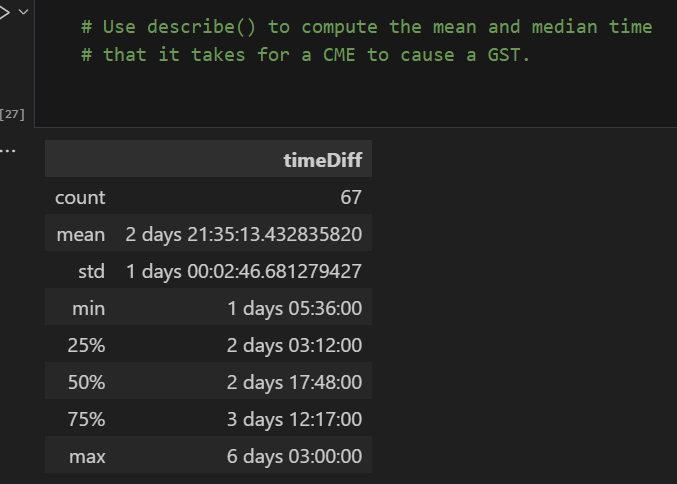

In [44]:
# Use describe() to compute the mean and median time 
# that it takes for a CME to cause a GST. 

# Compute mean and median time difference
time_diff_stats = merged_df['timeDiff'].describe()

# Extract mean and median
mean_time_diff = time_diff_stats['mean']
median_time_diff = time_diff_stats['50%']  # 50% quantile is the median

# Print the results
print("Mean time difference:", mean_time_diff)
print("Median time difference:", median_time_diff)

Mean time difference: NaT
Median time difference: NaT


### Exporting data in csv format

In [45]:
# Export data to CSV without the index

merged_df.to_csv("output/merged_data.csv", index=False)
